In [1]:
lines = readlines("../data/sp.txt")

24420-element Array{String,1}:
 " "                                                                                                                                                                                                                                                               
 "                                                                                                                                                                                                                                                                "
 " "                                                                                                                                                                                                                                                               
 "   caldt        vwretd        sprtrn      spindx"                                                                                                                                          

In [2]:
returns = [parse(Float64,line[14:22]) for line in lines[7:end]]

24414-element Array{Float64,1}:
  0.004297
 -0.001357
 -0.004603
  0.000537
  0.003907
 -0.002693
  0.002218
 -0.006515
 -0.001597
  0.003465
 -0.005732
 -0.012153
 -0.000511
  ⋮       
  0.002792
 -0.000889
 -0.002019
 -0.003911
  0.001673
 -0.006173
  0.00188 
 -0.013623
  0.002201
 -0.008636
  0.006236
  0.000819

In [3]:
logreturns = log.(1 .+ returns)

24414-element Array{Float64,1}:
  0.004287794257462213 
 -0.001357921558297472 
 -0.004613626425998323 
  0.0005368558670972804
  0.003899387497090424 
 -0.002696632647779301 
  0.0022155438691284176
 -0.006536315242139919 
 -0.0015982765637959106
  0.0034590107187521743
 -0.00574849095964746  
 -0.012227451525648858 
 -0.0005111306049947026
  ⋮                    
  0.0027881096076345863
 -0.0008893953948547479
 -0.0020210409280518467
 -0.003918667959957247 
  0.0016716020944135578
 -0.006192131738617332 
  0.001878235011772464 
 -0.013716644516583833 
  0.0021985813478186877
 -0.008673506340627165 
  0.006216636610370435 
  0.0008186648025052497

In [4]:
using StatsBase

In [5]:
mu = StatsBase.mean(logreturns)

0.00035914734608524524

In [6]:
sigma = StatsBase.std(logreturns)

0.011351077327298401

In [7]:
using Plots

In [8]:
slr = sort(logreturns)

24414-element Array{Float64,1}:
 -0.21639512326333227
 -0.12423643914331885
 -0.10572169198525538
 -0.1019840002849163 
 -0.09720938214791018
 -0.09427002095715059
 -0.09415464768878908
 -0.0932222610245464 
 -0.0928085115872751 
 -0.09111797936878639
 -0.08765158187705306
 -0.08658237811371688
 -0.08653439985222174
  ⋮                  
  0.08362489934154087
  0.08444867941679338
  0.08480795122907686
  0.08730641679443917
  0.0887532756695258 
  0.09398839754399951
  0.10187043239632772
  0.10897009328718855
  0.11181146347927151
  0.11627434259557277
  0.11834465569609846
  0.15540674778636834

In [9]:
using Distributions

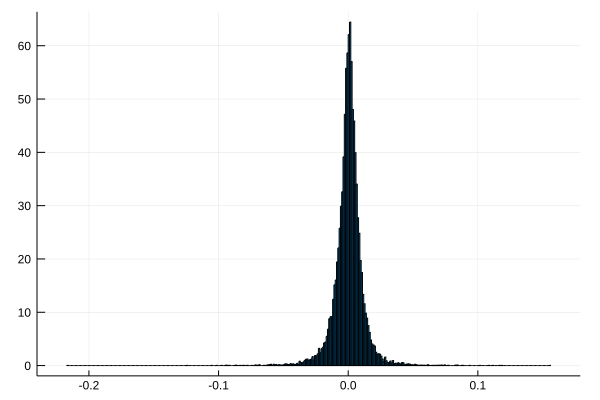

In [10]:
histogram(slr,normalize=:pdf, legend=false)

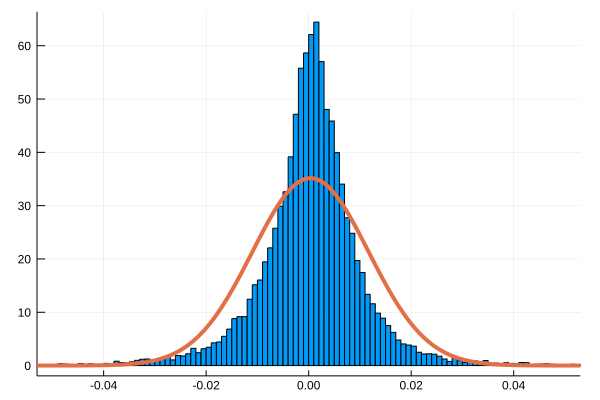

In [11]:
plot!(slr, pdf(Normal(mu,sigma),slr), linewidth=4, legend=false, xlims=[-0.05,0.05])

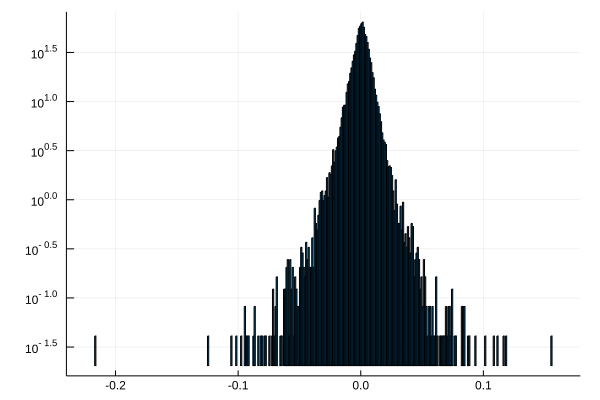

In [12]:
histogram(slr, normalize=:pdf, legend=false, yscale=:log10)

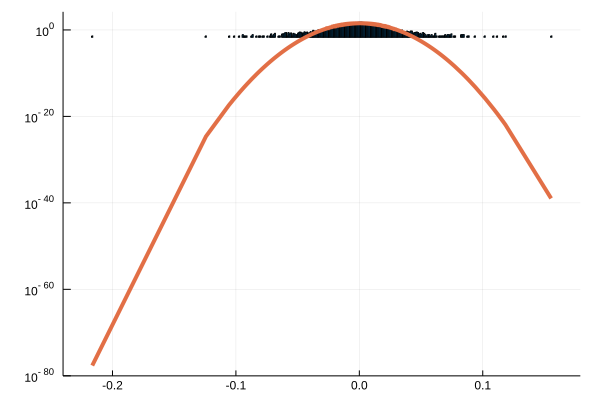

In [13]:
plot!(slr, pdf(Normal(mu,sigma),slr), linewidth=4)

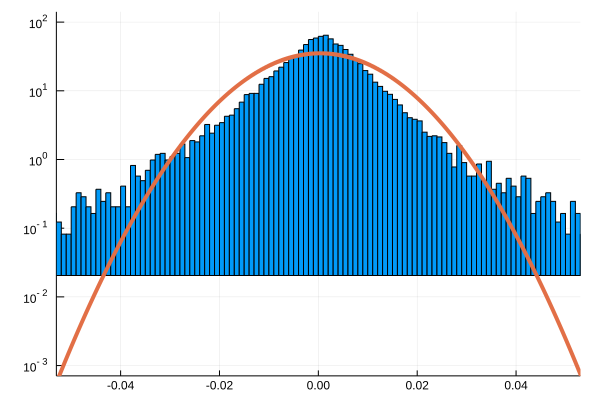

In [14]:
plot!(xlims=[-0.05,0.05], ylims=[0.001,100.0])

In [15]:
cdf(Normal(mu,sigma),minimum(logreturns))

1.3765761130596416e-81

In [16]:
Pkg.add("SpecialFunctions")

  Updating registry at `/home/jrun/.julia/registries/JuliaPro`
  Updating git-repo `https://pkg.juliacomputing.com/registry/JuliaPro`
 Resolving package versions...
  Updating `~/.julia/Project.toml`
 [no changes]
  Updating `~/.julia/Manifest.toml`
 [no changes]


In [17]:
using SpecialFunctions

In [18]:
function f(parameters, g, x)
    (mu, sigma, nu) = parameters
    n = length(x)
    normalx = (x .- mu)/sigma
    normalxsq = normalx.^2
    g[1] = (nu + 1)*sum(normalx ./ (nu .+ normalxsq))
    g[2] = -n/sigma + (nu+1)*sum(normalxsq ./ (sigma*(nu .+ normalxsq)))
    g[3] = n*(digamma((nu+1)/2)/2 - 1/(2*nu) - digamma(nu/2)/2)
    g[3] += -sum(log.(1 .+ normalxsq/nu))/2 + (nu+1)/(2*nu)*sum(normalxsq ./ (nu .+ normalxsq))
    constant = n*(log(gamma((nu+1)/2)) - log(nu*pi)/2 - log(gamma(nu/2)) - log(sigma))
    return constant - (nu+1)/2*sum(log.(1 .+ normalxsq/nu))
end

f (generic function with 1 method)

In [19]:
tdist = TDist(4)

TDist{Float64}(ν=4.0)

In [20]:
using Random

In [21]:
Random.seed!(1)

MersenneTwister(UInt32[0x00000001], Random.DSFMT.DSFMT_state(Int32[1749029653, 1072851681, 1610647787, 1072862326, 1841712345, 1073426746, -198061126, 1073322060, -156153802, 1073567984  …  1977574422, 1073209915, 278919868, 1072835605, 1290372147, 18858467, 1815133874, -1716870370, 382, 0]), [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0  …  0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0], UInt128[0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000  …  0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x00000000000000000000000000000000, 0x000000000000

In [22]:
x = rand(tdist,1000)

1000-element Array{Float64,1}:
  0.29692490632005564 
 -0.6930441678889686  
  0.18546556279647125 
 -2.152168043033168   
  0.40229630090864155 
  0.9368227551811843  
 -0.5169526249438642  
 -0.08127047126103581 
  0.2018951900318011  
  0.7216686471437038  
  0.6529633769029046  
 -0.12141578141762015 
 -0.06584280036269574 
  ⋮                   
 -1.0828804450300298  
  1.4974557447833812  
  0.30017126643528363 
  0.16788863936219858 
  0.1712462040274386  
 -0.37359494092507695 
 -1.174449362828422   
  0.0959318923021618  
  0.05443512263323415 
  1.3906188046700285  
 -0.30365600569868606 
 -0.041593208836278144

In [23]:
loglikelihood(tdist,x)

-1710.4385404439342

In [24]:
g = fill(NaN,3)
f([0.0,1.0,4.0],g,x)

-1710.4385404439322

In [25]:
g

3-element Array{Float64,1}:
 21.928076285894768 
 22.49187098435766  
 -2.9242208400091965

In [26]:
(f([1e-6,1.0,4.0],g,x) - f([-1e-6,1.0,4.0],g,x))/2e-6

21.928076307631272

In [27]:
(f([0.0,1+1e-6,4.0],g,x) - f([0.0,1-1e-6,4.0],g,x))/2e-6

22.49187105007877

In [28]:
(f([0.0,1.0,4.0 + 1e-6],g,x) - f([0.0,1.0,4.0 - 1e-6],g,x))/2e-6

-2.92422078018717

In [29]:
@assert((f([1e-6,1.0,4.0],g,x) - f([-1e-6,1.0,4.0],g,x))/2e-6/g[1] - 1<1e-4)

In [30]:
@assert((f([0.0,1+1e-6,4.0],g,x) - f([0.0,1-1e-6,4.0],g,x))/2e-6/g[2] - 1<1e-4)

In [31]:
@assert((f([0.0,1.0,4.0 + 1e-6],g,x) - f([0.0,1.0,4.0 - 1e-6],g,x))/2e-6/g[3] - 1<1e-4)

In [32]:
using NLopt

In [33]:
function fitmle(x, p0)
    problem = Opt(:LD_MMA,3)
    lower_bounds!(problem,[-Inf,1e-8,1.0])
    xtol_rel!(problem,1e-4)
    max_objective!(problem, (p,g)->f(p,g,x))
    (minf,p,ret)=optimize(problem,p0)
    return p
end

fitmle (generic function with 1 method)

In [34]:
fitmle(x, [0.0,1.0,4.0])

3-element Array{Float64,1}:
 0.03232934576720358
 0.993749292298247  
 3.558326207914573  

In [35]:
ps = Vector{Float64}[]
for i = 1:1000
    p0=[rand(Normal()),rand(Exponential()),1.0+rand(Exponential())]
    push!( ps, fitmle(x, p0) )
end

In [36]:
ps

1000-element Array{Array{Float64,1},1}:
 [0.0323321, 0.993664, 3.55752]
 [0.0323311, 0.993695, 3.55799]
 [0.0323286, 0.993666, 3.55755]
 [0.0323336, 0.993672, 3.5576] 
 [0.0323268, 0.993669, 3.55758]
 [0.0323329, 0.993673, 3.5576] 
 [0.0323337, 0.993669, 3.55757]
 [0.0323352, 0.993674, 3.55764]
 [0.0323339, 0.993658, 3.55744]
 [0.0323362, 0.993661, 3.55726]
 [0.0323353, 0.993651, 3.55741]
 [0.0323318, 0.993681, 3.55772]
 [0.0323345, 0.993667, 3.55761]
 ⋮                             
 [0.032335, 0.993666, 3.55744] 
 [0.0323357, 0.993659, 3.55744]
 [0.0323305, 0.99365, 3.55741] 
 [0.0323326, 0.993664, 3.55753]
 [0.0323323, 0.993636, 3.55737]
 [0.0323324, 0.993672, 3.55763]
 [0.0323339, 0.993657, 3.55752]
 [0.0323344, 0.993678, 3.55773]
 [0.0323276, 0.993673, 3.55772]
 [0.0323328, 0.993652, 3.55741]
 [0.0323338, 0.993672, 3.55761]
 [0.032334, 0.993658, 3.55736] 

In [37]:
unique([maximum(abs.(dp)) for dp in diff(ps)])

999-element Array{Float64,1}:
 0.00046437972695656526
 0.000438318627243639  
 4.853688602013406e-5  
 1.85747224885624e-5   
 2.5994828124709102e-5 
 3.31346188295889e-5   
 7.106545230461947e-5  
 0.0001965761537978672 
 0.00018400119394712533
 0.0001448553988740997 
 0.0003155666331142726 
 0.00011268394779406776
 2.6187069480876346e-5 
 ⋮                     
 1.0675953559191598e-5 
 6.903520809009578e-6  
 2.6335229899920876e-5 
 0.00012212546256940016
 0.00016485017283640602
 0.0002616597021232181 
 0.0001089242537508639 
 0.00020561874936086966
 6.833035454067993e-6  
 0.0003181382256065568 
 0.0002047472610322565 
 0.0002494544555085021 

In [38]:
ps = Vector{Float64}[]
for i = 1:100
    p0=[rand(Normal()),rand(Exponential()),1.0+rand(Exponential())]
    push!( ps, fitmle(logreturns,p0) )
end

In [39]:
ps

100-element Array{Array{Float64,1},1}:
 [0.000644622, 0.00619147, 2.52472]
 [0.000644638, 0.00619135, 2.52463]
 [0.000644412, 0.0061913, 2.52443] 
 [0.000644641, 0.00619137, 2.52458]
 [0.000644599, 0.0061916, 2.52497] 
 [0.000644605, 0.00619129, 2.52455]
 [0.000644567, 0.00619205, 2.52523]
 [0.00064462, 0.00619143, 2.52465] 
 [0.000644524, 0.00619147, 2.52468]
 [0.000644645, 0.00619125, 2.52454]
 [0.000644591, 0.00619166, 2.52487]
 [0.000644625, 0.00619156, 2.52477]
 [0.000644546, 0.00619138, 2.52463]
 ⋮                                 
 [0.000644613, 0.00619157, 2.52478]
 [0.000644655, 0.00619135, 2.5246] 
 [0.000644371, 0.00619191, 2.52511]
 [0.000644985, 0.00619134, 2.52463]
 [0.000644623, 0.00619149, 2.5247] 
 [0.000644614, 0.0061916, 2.52481] 
 [0.000644615, 0.00619126, 2.52451]
 [0.00064458, 0.00619167, 2.52497] 
 [0.000644421, 0.00619075, 2.52403]
 [0.000644635, 0.0061915, 2.52472] 
 [0.000644625, 0.00619149, 2.5247] 
 [0.000587085, 0.007096, 4.17822]  

In [40]:
nus = [p[3] for p in ps]

100-element Array{Float64,1}:
 2.5247155914362707
 2.524630771232116 
 2.5244347918737047
 2.5245803009277057
 2.5249729111000394
 2.5245456403910946
 2.5252313525935315
 2.524648285596878 
 2.5246773473968704
 2.5245433639098582
 2.5248692786872273
 2.52476869025176  
 2.5246345659884963
 ⋮                 
 2.5247782561639633
 2.524598952596042 
 2.5251094361203354
 2.5246259823658224
 2.5247016124022594
 2.524807062709888 
 2.5245096224111294
 2.524972716959901 
 2.5240250221426352
 2.5247174466096323
 2.5247035801243842
 4.178215348860451 

In [41]:
sort(nus)

100-element Array{Float64,1}:
 2.523451087718754 
 2.5234604718346896
 2.5240250221426352
 2.5240409290016355
 2.5240465519260007
 2.524049164003651 
 2.5241166007660425
 2.5241592415824905
 2.524216067578392 
 2.524238495064983 
 2.524257174884741 
 2.524267180122923 
 2.524364755227714 
 ⋮                 
 2.5249729111000394
 2.5249823543631544
 2.5250014818468607
 2.525023675396018 
 2.5251094361203354
 2.525215485946551 
 2.5252313525935315
 2.525776122471062 
 2.5273071331050323
 2.5302471217721627
 2.5561331018072946
 4.178215348860451 

In [42]:
findall(nus.>4)

1-element Array{Int64,1}:
 100

In [51]:
index = findall(nus.>4)[1]

100

In [52]:
ps[index]

3-element Array{Float64,1}:
 0.0005870850057854703
 0.007095997355212949 
 4.178215348860451    

In [53]:
cdf( TDist(ps[1][3]), (minimum(logreturns)-ps[1][1])/ps[1][2])

9.216972256701709e-5

In [54]:
cdf( TDist(ps[index][3]), (minimum(logreturns)-ps[index][1])/ps[index][2])

2.2502073486724447e-6

In [55]:
f(ps[1],zeros(3),logreturns)

79130.67417219814

In [56]:
f(ps[index],zeros(3),logreturns)

78866.08450645005

In [57]:
theta = [rand(Normal()),rand(Exponential()),1 + rand(Exponential())]
theta = [0.0,1.0,4.0]

3-element Array{Float64,1}:
 0.0
 1.0
 4.0

In [58]:
prior = pdf(Normal(), theta[1])*pdf(Exponential(),theta[2])*pdf(Exponential(), theta[3]-1)

0.007306882745280778

In [59]:
ll = f(theta,zeros(3),x)

-1710.4385404439322

In [60]:
acceptances = 0
for i = 1:10000
    thetaprime = [theta[1] + 0.1*rand(Normal()), theta[2]*exp(0.1*rand(Normal())), 1 + (theta[3]-1)*exp(0.1*rand(Normal()))]
    priorprime = pdf(Normal(), thetaprime[1])*pdf(Exponential(),thetaprime[2])*pdf(Exponential(), theta[3]-1)
    llprime = f(thetaprime,zeros(3),x)
    rho = min(1,priorprime/prior * exp(llprime - ll))
    if rand() <= rho
        theta = thetaprime
        prior = priorprime
        ll = llprime
        acceptances += 1
    end
end

In [61]:
acceptances

1518

In [62]:
ll

-1709.9771987314382

In [63]:
theta

3-element Array{Float64,1}:
 0.004886628787237668
 1.0221042119712567  
 3.879303201183295   